In [1]:
import sys
sys.path.append('/home/nick/projects')
# from PointGPT import segmentation
import alphashape
import numpy as np
import pandas as pd
import os
from glob2 import glob
import plotly.express as px
import plotly.graph_objects as go
import torch
from src.utilities.functions import path_leaf
from src.utilities.fin_class_def import FinData
from tqdm import tqdm

### Test 3D mesh fitting and export examples
I have previously had difficulty extracting robust meshes. I want to investigate if sampling multiple points per nucleus, rather than solely the centroids, might help improve mesh quality. 

I also am curious about the possibility of getting probabalistic meshes through bootstrapping or the like

### Load test dataset

In [2]:
# root = "/Users/nick/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/pecfin_dynamics/"
root = "/media/nick/hdd02/Cole Trapnell's Lab Dropbox/Nick Lammers/Nick/pecfin_dynamics/"

fin_object_path = os.path.join(root, "point_cloud_data", "fin_objects", "")
fin_object_list = sorted(glob(fin_object_path + "*.pkl"))

In [3]:
file_ind01 = 146
seg_type = "tissue_only_best_model_tissue"

fp01 = fin_object_list[file_ind01]
point_prefix01 = path_leaf(fp01).replace("_fin_object.pkl", "")
print(point_prefix01)

fin_data = FinData(data_root=root, name=point_prefix01, tissue_seg_model=seg_type)
fin_df = fin_data.full_point_data
fin_df = fin_df.loc[fin_df["fin_label_curr"]==1, :]
fin_points = fin_df[["X", "Y", "Z"]].to_numpy()

fin_axis_df = fin_data.axis_fin
fin_axes = fin_data.calculate_axis_array(fin_axis_df)
fin_points_pca = np.matmul(fin_points - np.mean(fin_points, axis=0), fin_axes.T)
fin_df.loc[:, ["XP", "YP", "ZP"]] = fin_points_pca

20240711_02_well0053_time0000


### Load mask, upsample points, and apply z-adjustment

In [4]:
import numpy as np
import glob2 as glob 
import zarr
from sklearn.neighbors import KDTree

# load nuclear mask
well_ind = point_prefix01.find("well")
date = point_prefix01[:well_ind-1]#"20240711_01"
print(date)
model = "tdTom-bright-log-v5"
well_num = int(point_prefix01[well_ind+4:well_ind+8])
path_string = os.path.join(root, "built_data", "mask_stacks", model, date, date + f"_well{well_num:04}" + "*aff*")
mask_path = glob.glob(path_string)[0]

# load mask and filter for nuclei that are inside the fin
mask_raw = zarr.open(mask_path, mode="r")
mask = np.squeeze(mask_raw[0])
mask[~np.isin(mask, fin_df.nucleus_id.to_numpy())] = 0
scale_vec = mask_raw.attrs["voxel_size_um"]
print(scale_vec)

# sample N points per mask
n_points = 25

# make ref grids
x_vec = np.arange(mask.shape[2])*scale_vec[2]
y_vec = np.arange(mask.shape[1])*scale_vec[1]
z_vec = np.arange(mask.shape[0])*scale_vec[0]
z_ref, y_ref, x_ref = np.meshgrid(z_vec, y_vec, x_vec, indexing="ij")

np.random.seed(436)

# get DF of values
li = np.where(mask.ravel() > 0)[0]
mask_df = pd.DataFrame(mask.ravel()[li], columns=["nucleus_id"])
z_factor = 1.95 # rough estimate for now
mask_df[["X", "Y", "Z"]] = np.c_[x_ref.ravel()[li], y_ref.ravel()[li], z_ref.ravel()[li]]

# quick pass to remove extreme outliers
k_nn = 3
tree = KDTree(mask_df[["X", "Y", "Z"]].to_numpy())
nearest_dist, nearest_ind = tree.query(mask_df[["X", "Y", "Z"]].to_numpy(), k=k_nn + 1)

nn_mean = np.mean(nearest_dist, axis=0)
nn_scale = nn_mean[1]
space_outliers = (nearest_dist[:, k_nn] > 5 * nn_scale).ravel()
mask_df = mask_df.loc[~space_outliers, :]

# adjust fopr z dispersion
mask_df = mask_df.merge(fin_df.loc[:, ["nucleus_id", "Z"]].rename(columns={"Z":"zm"}), how="left", on="nucleus_id")
mask_df["Zd"] = mask_df["zm"] + (mask_df["Z"] - mask_df["zm"]) / z_factor
                        
# draw grouped random sampled
fin_df_samp = mask_df.groupby("nucleus_id").sample(n=n_points).reset_index(drop=True)

# apply axis correct and z correction

fin_points_samp = fin_df_samp[["X", "Y", "Zd"]].to_numpy()
# fin_points_samp[:, 2] = fin_points_samp[:, 2]
fin_points_pca_samp = np.matmul(fin_points_samp - np.mean(fin_points_samp, axis=0), fin_axes.T)
fin_df_samp.loc[:, ["XP", "YP", "ZP"]] = fin_points_pca_samp


20240711_02
[1.5, 0.55, 0.55]


### Visualize the result

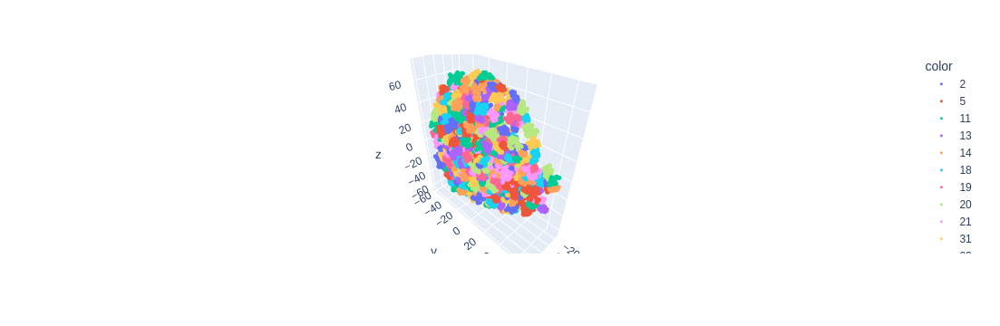

In [5]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# test out the warp function
raw_points = fin_df_samp[["ZP", "YP", "XP"]].to_numpy() # note that Ii permute the axes for convenience

fig = px.scatter_3d(x=raw_points[:, 0], y=raw_points[:, 1], z=raw_points[:, 2], color=fin_df_samp["nucleus_id"]) #make_subplots(rows=1, cols=2, specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]])

fig.update_traces(marker=dict(size=3))

fig.update_layout(
             scene=dict(
                 aspectmode='data'
                 ))

fig.show()

### Use mesh fits to estimate center points

In [6]:
def plot_mesh(plot_hull, surf_alpha=0.2):
    
    tri_points = plot_hull.vertices[plot_hull.faces]
    
    #extract the lists of x, y, z coordinates of the triangle vertices and connect them by a line
    Xe = []
    Ye = []
    Ze = []
    for T in tri_points:
        Xe.extend([T[k%3][0] for k in range(4)]+[ None])
        Ye.extend([T[k%3][1] for k in range(4)]+[ None])
        Ze.extend([T[k%3][2] for k in range(4)]+[ None])
        
           
    #define the trace for triangle sides
    fig = go.Figure()
    lines = go.Scatter3d(
                       x=Xe,
                       y=Ye,
                       z=Ze,
                       mode='lines',
                       name='',
                       line=dict(color= 'rgb(70,70,70, 0.5)', width=1)) 
    
    lighting_effects = dict(ambient=0.4, diffuse=0.5, roughness = 0.9, specular=0.9, fresnel=0.9)
    mesh = go.Mesh3d(x=plot_hull.vertices[:, 0], y=plot_hull.vertices[:, 1],z=plot_hull.vertices[:, 2], 
                            opacity=surf_alpha, i=plot_hull.faces[:, 0], j=plot_hull.faces[:, 1], k=plot_hull.faces[:, 2],
                             lighting=lighting_effects)
    fig.add_trace(mesh)
    
    fig.add_trace(lines)
    fig.update_layout(template="plotly")

    return fig, lines, mesh

In [41]:
def get_center_points(fin_hull):
    
    # use ray-tracing to find intersections
    ray_origins = fin_hull.vertices
    ray_directions = -fin_hull.vertex_normals

    ray_intersections = fin_hull.ray.intersects_location(ray_origins=ray_origins, ray_directions=ray_directions)

    # build normal average array
    centerpoint_array = np.empty(ray_origins.shape)
    centerpoint_array[:] = np.nan
    for i in range(centerpoint_array.shape[0]):
        ray_ft = ray_intersections[1] == i
        if np.sum(ray_ft) == 2:
            centerpoint_array[i, :] = np.mean(ray_intersections[0][ray_ft, :], axis=0)

    if np.mean(np.isnan(centerpoint_array)) > 0.5:
        ray_directions = fin_hull.vertex_normals

        ray_intersections = fin_hull.ray.intersects_location(ray_origins=ray_origins,
                                                             ray_directions=ray_directions)

        # build normal average array
        centerpoint_array = np.empty(ray_origins.shape)
        centerpoint_array[:] = np.nan
        for i in range(centerpoint_array.shape[0]):
            ray_ft = ray_intersections[1] == i
            if np.sum(ray_ft) >= 2:
                centerpoint_array[i, :] = np.mean(ray_intersections[0][ray_ft, :], axis=0)


    centerpoint_array = centerpoint_array[~np.isnan(centerpoint_array[:, 0]), :]

    return centerpoint_array
    

In [42]:
import trimesh


def fit_fin_hull(xyz_fin, alpha=20, n_faces=512, smoothing_strength=5):

    # normalize for alphshape fitting
    mp = np.min(xyz_fin)
    points = xyz_fin - mp
    mmp = np.max(points)
    points = points / mmp

    raw_hull = alphashape.alphashape(points, alpha)
    
    # copy
    hull02_cc = raw_hull.copy()
    
    # keep only largest component
    hull02_cc = hull02_cc.split(only_watertight=False)
    hull02_sm = max(hull02_cc, key=lambda m: m.area)
    
    # fill holes
    hull02_sm.fill_holes()
    
    # smooth
    hull02_sm = trimesh.smoothing.filter_laplacian(hull02_sm, iterations=smoothing_strength)
    
    # resample
    hull02_rs = hull02_sm.simplify_quadric_decimation(face_count=n_faces)
    hull02_rs = hull02_rs.split(only_watertight=False)
    hull02_rs = max(hull02_rs, key=lambda m: m.area)
    hull02_rs.fill_holes()
    hull02_rs.fix_normals()

    vt = hull02_rs.vertices
    vt = vt * mmp
    vt = vt + mp
    hull02_rs.vertices = vt
    
    # check
    wt_flag = hull02_rs.is_watertight

    return hull02_rs, raw_hull, wt_flag

In [43]:
# try again with better mask info
alpha = 20
xyz_fin = fin_df_samp[["XP", "YP", "ZP"]].to_numpy()
fin_hull, raw_hull, wt_flag = fit_fin_hull(xyz_fin)
fin_centerpoints = get_center_points(fin_hull)
print(wt_flag)

True


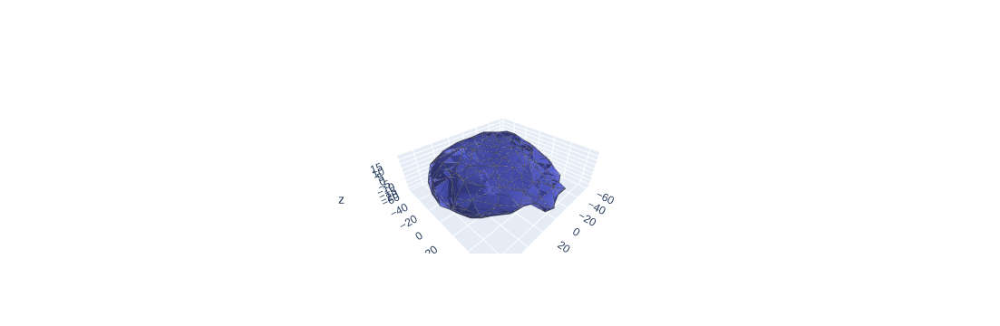

In [44]:
c_fig, _, _ = plot_mesh(fin_hull, surf_alpha=0.9)
c_fig.show()

### Experiment with extracting centerpoints

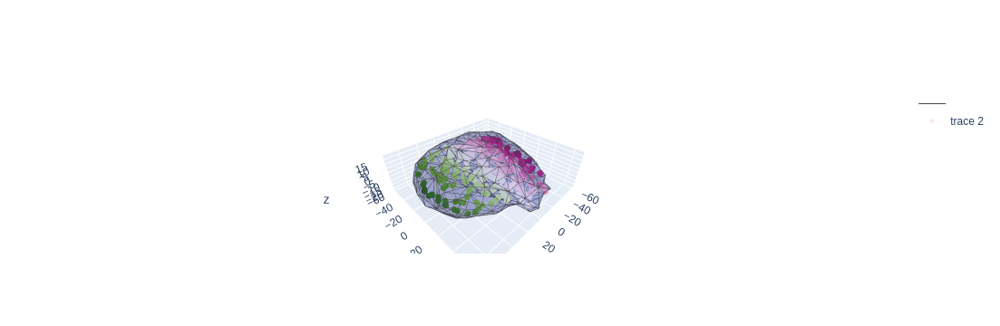

In [45]:
fig , _, _ = plot_mesh(fin_hull, surf_alpha=0.25)
fig.add_traces(go.Scatter3d(x=fin_centerpoints[:, 0], y=fin_centerpoints[:, 1], z=fin_centerpoints[:, 2], mode="markers",
                           marker=dict(size=4, color=fin_centerpoints[:, 0])))

fig.show()

In [46]:
from sklearn.metrics import pairwise_distances

# Use simple numerical procedure to calculate distance of each fin point to the yolk
fin_points = fin_df_samp[["X", "Y", "Z"]].to_numpy()

params = fin_data.yolk_surf_params

x_min, y_min = fin_points[:, 0].min(), fin_points[:, 1].min()
x_max, y_max = fin_points[:, 0].max(), fin_points[:, 1].max()

# Create a mesh grid for x and y values
x_vals = np.linspace(x_min, x_max, 100)
y_vals = np.linspace(y_min, y_max, 100)
X, Y = np.meshgrid(x_vals, y_vals)

yolk_xyz = np.reshape(fin_data.polyval2d(np.c_[X.ravel(), Y.ravel()], params).ravel(), (-1, 3))

dist_array = pairwise_distances(fin_points, yolk_xyz)
yolk_dist = np.min(dist_array, axis=1)
min_i = np.argmin(dist_array, axis=1)
yolk_signs = np.sign(fin_points[:, 2] - yolk_xyz[min_i, 2])
yolk_dist = np.multiply(yolk_dist, yolk_signs)

# fig = px.scatter_3d(x=fin_points[:, 0], y=fin_points[:, 1], z=fin_points[:, 2], color=yolk_dist)
# fig.update_traces(marker=dict(size=4))
# fig.show()                 

In [47]:
pca_fin_array = fin_df_samp.loc[:, ["XP", "YP", "ZP"]].to_numpy()

fin_axis_df = fin_data.axis_fin
fin_axes = fin_data.calculate_axis_array(fin_axis_df)

# fin_scale = np.mean(np.std(pca_fin_array, axis=0))

base_pd_thresh = np.percentile(fin_centerpoints[:, 0], 50)
base_yolk_thresh = 5

n_fin_points = fin_centerpoints.shape[0]

# select base points
base_ft = (pca_fin_array[:, 0] <= base_pd_thresh) & (yolk_dist <= base_yolk_thresh)
base_indices = np.where(base_ft)[0]

# calculate centroid
yolk_surf_raw = fin_data.yolk_surf_points
yolk_surf = np.matmul(yolk_surf_raw - np.mean(fin_points, axis=0), fin_axes.T)
surf_cm = np.mean(pca_fin_array[base_ft], axis=0)
closest_i = np.argmin(np.sqrt(np.sum((surf_cm - yolk_surf) ** 2, axis=1)))  # find closest surface point
closest_point = yolk_surf[closest_i]

In [48]:
surf_cm_raw = np.matmul(surf_cm, np.linalg.inv(fin_axes.T)) + np.mean(fin_points, axis=0)

In [49]:
from scipy.optimize import minimize

# find closest point on the yolk surface
Qx, Qy, Qz = surf_cm_raw
params = fin_data.yolk_surf_params

# Objective function: squared distance from Q to the surface point
def distance_to_surface(xy):
    
    out = fin_data.polyval2d(np.reshape(xy, (1,2)), params).ravel()
    # Squared distance from Q to (x, y, z)
    return (out[0] - Qx)**2 + (out[1] - Qy)**2 + (out[2] - Qz)**2

x0 = closest_point[:2]
# Minimize the distance function with respect to x and y
result = minimize(distance_to_surface, x0, method='BFGS')
# Calculate z from the optimized x, y values
x_opt, y_opt = result.x


Q = fin_data.polyval2d(np.reshape(result.x, (1,2)), params).ravel()

print(Q)

[227.68037713 325.94718336  57.53842819]


In [50]:
# find the normal vector at Q
surf_normal_raw, _ = fin_data.calculate_tangent_plane(fin_data.yolk_surf_params, Q)
if surf_normal_raw[2] > 0:
    surf_normal_raw = -surf_normal_raw

surf_normal = np.matmul(np.reshape(surf_normal_raw, (1, 3)) , fin_axes.T)[0]
surf_normal = surf_normal / np.linalg.norm(surf_normal)

In [51]:

# def fit_quadratic_surface(points, P, Q, wt):
#     """
#     Fit a quadratic surface to points with the constraint that the surface is tangent
#     to a plane P at point Q.

#     Parameters:
#     - points: Nx3 numpy array of point cloud data (x, y, z) coordinates.
#     - P: 1x4 array defining the plane in the form [a, b, c, d], where ax + by + cz + d = 0.
#     - Q: 1x3 array defining the point Q (x, y, z) on the surface that should be tangent to P.

#     Returns:
#     - coeffs: The coefficients [a, b, c, d, e, f] for the fitted surface z = ax^2 + by^2 + cxy + dx + ey + f.
#     """
    
#     # Extract the normal of plane P and point Q coordinates
#     P_normal = np.array(P[:3])
#     Qx, Qy, Qz = Q

#     # Define the surface model: z = ax^2 + by^2 + cxy + dx + ey + f
#     def surface_model(xy, coeffs):
#         x, y = xy
#         a, b, c, d, e, f = coeffs
#         return a*x**2 + b*y**2 + c*x*y + d*x + e*y + f

#     # Create the function to minimize
#     def residuals(coeffs):
#         a, b, c, d, e, f = coeffs
        
#         # Fitting residuals: (z - fitted_surface(x, y)) for each point
#         fit_residuals = np.array([
#             z - (a*x**2 + b*y**2 + c*x*y + d*x + e*y + f)
#             for x, y, z in points
#         ])

#         # Tangency constraint residuals:
#         # 1. Surface passes through point Q
#         tangent_residual = Qz - (a*Qx**2 + b*Qy**2 + c*Qx*Qy + d*Qx + e*Qy + f)

#         # 2. Gradient at Q is parallel to P_normal
#         # Gradient of the surface at (Qx, Qy) is [∂z/∂x, ∂z/∂y]
#         dz_dx = 2*a*Qx + c*Qy + d
#         dz_dy = 2*b*Qy + c*Qx + e
#         grad_residual = np.cross([dz_dx, dz_dy, -1], P_normal)
        
#         return np.concatenate([fit_residuals, 100*[tangent_residual]])

#     # Initial guess for coefficients
#     initial_guess = np.zeros(6)

#     # Perform least-squares optimization
#     result = least_squares(residuals, initial_guess)

#     # Return the optimized coefficients
#     return result.x

In [52]:
def polyfit2d_fin(xyz, order=2):

    x = xyz[:, 0]
    y = xyz[:, 1]
    z = xyz[:, 2]
    ncols = 2 * order + 1

    G = np.zeros((x.size, ncols))

    G[:, 0] = 1
    for o in range(order):
        ind = 2 * o + 1
        G[:, ind] = x ** (o + 1)
        G[:, ind + 1] = y ** (o + 1)

    # if not reg_flag:
    #     if pd_ind == 0:
    #         G[:, -1] = x ** (order + 1)
    #     else:
    #         G[:, -1] = y ** (order + 1)
    #     # print(G.shape)

    fit_params, resid, _, _ = np.linalg.lstsq(G, z)

    return fit_params

In [53]:
def polyval2d_fin(xyz, fit_params):

    x = xyz[:, 0]
    y = xyz[:, 1]
    order = int((len(fit_params) - 1) / 2)
    # ij = itertools.product(range(order + 1), range(order + 1))
    z = np.zeros_like(x)

    z += fit_params[0]

    for o in range(order):
        ind = 2 * o + 1
        z += fit_params[ind] * x ** (o + 1)
        z += fit_params[ind + 1] * y ** (o + 1)

    return np.c_[x, y, z]

In [54]:
from scipy.optimize import least_squares

Q_pca = np.matmul(Q - np.mean(fin_points, axis=0), fin_axes.T)

# calculate plan normal
p_norm = np.cross(surf_normal, np.asarray([0, 1, 0]))
p_norm = p_norm / np.sqrt(np.sum(p_norm**2))
d = -np.sum(np.multiply(Q_pca, p_norm))
P = np.asarray([p_norm[0], p_norm[1], p_norm[2], d])

fin_centerpoints_fit = fin_centerpoints.copy()
fin_centerpoints_fit = fin_centerpoints_fit[fin_centerpoints_fit[:, 2] >= Q_pca[2]]

fit_params = polyfit2d_fin(fin_centerpoints)

In [55]:
surf_normal

array([0.09373312, 0.20097688, 0.97510122])

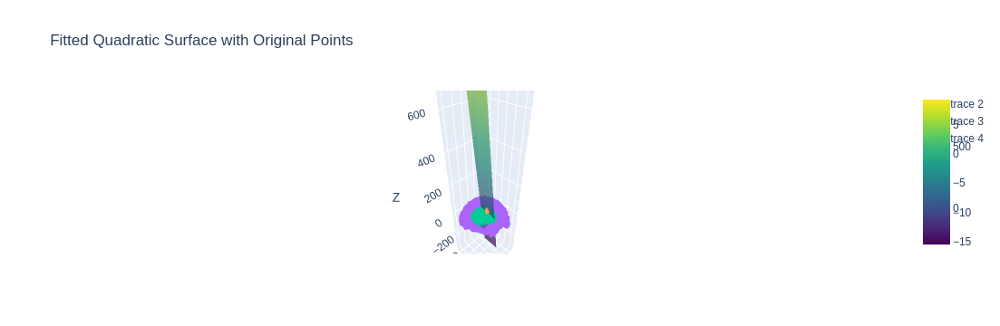

In [56]:
### get plane
points = fin_centerpoints

x_min, y_min = points[:, 0].min(), points[:, 1].min()
x_max, y_max = points[:, 0].max(), points[:, 1].max()

# Create a mesh grid for x and y values
x_vals = np.linspace(x_min, x_max, 100)
y_vals = np.linspace(y_min, y_max, 100)
X, Y = np.meshgrid(x_vals, y_vals)

ZP = - (P[0]*X + P[1]*Y + P[3]) / P[2]
XYZ = polyval2d_fin(np.c_[X.ravel(), Y.ravel()], fit_params)
surf_pd = XYZ[:, 2]
# sc, surf = plot_quadratic_surface(test, fin_centerpoints)

# Plotly figure layout
fig = go.Figure()

fig.update_layout(
    title='Fitted Quadratic Surface with Original Points',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    )
)

n_vec = np.asarray([Q_pca + n*surf_normal for n in np.linspace(0, 50)])
# n_vec = np.asarray([n*surf_normal_raw for n in np.linspace(0,50)])

fig.add_traces(go.Surface(x=X, y=Y, z=ZP, colorscale='Viridis', opacity=0.7, name='Plane'))
fig.add_traces(go.Surface(x=X, y=Y, z=np.reshape(surf_pd, X.shape), colorscale='Viridis', opacity=0.7, name='Plane'))
fig.add_traces(go.Scatter3d(x=points[:, 0], y=points[:, 1], z=points[:, 2], mode="markers", marker=dict(size=3)))
# fig.add_traces(go.Scatter3d(x=yolk_surf_raw[:, 0], y=yolk_surf_raw[:, 1], z=yolk_surf_raw[:, 2], mode="markers", marker=dict(size=3)))
fig.add_traces(go.Scatter3d(x=yolk_surf[:, 0], y=yolk_surf[:, 1], z=yolk_surf[:, 2], mode="markers", marker=dict(size=3)))
fig.add_traces(go.Scatter3d(x=n_vec[:, 0], y=n_vec[:, 1], z=n_vec[:, 2], mode="markers", marker=dict(size=3)))

# fig.update_traces()
fig.update_layout(
             scene=dict(
                 aspectmode='data'
                 ))

fig.show()

In [61]:
# use distance along plane from origin 
# xyz_arr = np.c_[X.ravel(), Y.ravel(), ZP.ravel()]

# # calculate eclidean distance from Q
# dist_pd = np.sqrt(np.sum((xyz_arr[:, [0, 2]] - Q_pca[[0, 2]])**2, axis=1))
# dist_pd = np.multiply(dist_pd, np.sign(xyz_arr[:, 2]-Q_pca[2]))
dist_pd = X.ravel() - Q_pca[2]
# dist_pd = dist_pd - np.min(dist_pd)


# generate weight using sigmoid function
t=3
kd=-25
# wt_vec = np.ones(surf_pd.shape)

# wt_vec[dist_pd < 0] = 0 # plane only
# wt_vec[(dist_pd >= 0) & (dist_pd < kd)] = kd - dist_pd[(dist_pd >= 0) & (dist_pd < kd)]
# wt_vec[dist_pd >= kd] = 1

# wt_vec = np.divide(np.exp(dist_pd/t), np.exp(kd/t) + np.exp(dist_pd/t))
wt_vec = np.divide(1, np.exp(-(dist_pd-kd)/t) + 1)
# wt_vec[dist_pd < 0]


pd_agg = np.multiply(wt_vec, surf_pd) + np.multiply(1-wt_vec, ZP.ravel())
ft = pd_agg >= -35
pd_agg[~ft] = np.nan

fig, _, _ = plot_mesh(fin_hull, surf_alpha=0.25)

fig.add_traces(go.Scatter3d(x=[Q_pca[0]], y=[Q_pca[1]], z=[Q_pca[2]]))

fig.add_traces(go.Surface(x=X, y=Y, z=np.reshape(pd_agg, X.shape), colorscale='Viridis', opacity=0.7, name='Plane'))
   
fig.update_layout(
             scene=dict(
                 zaxis=dict(range=[-25, 30]),
                 aspectmode='data'
                 ))


fig.show()

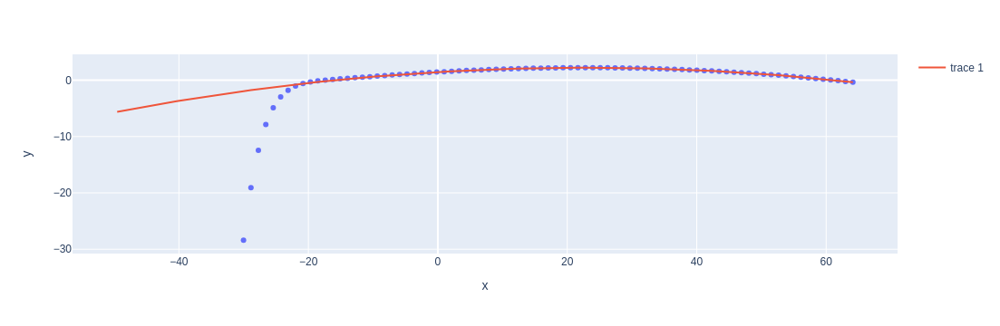

In [66]:
fig = px.scatter(x=X[50, :], y=np.reshape(pd_agg, X.shape)[50, :])
fig.add_trace(go.Scatter(x=X[50, :], y=np.reshape(surf_pd, X.shape)[50, :]))
fig.show()

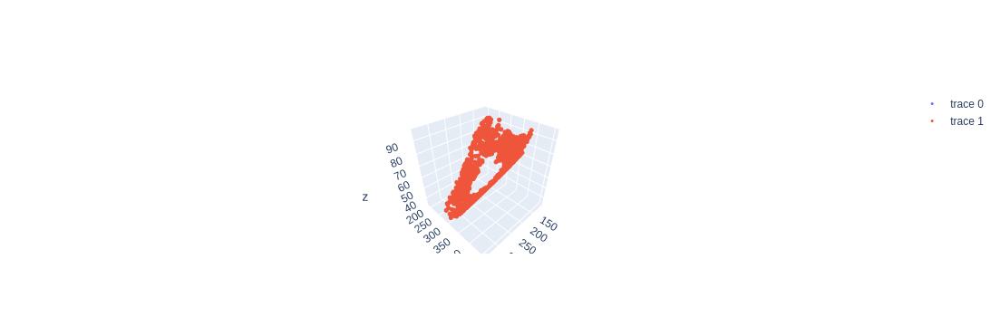

In [67]:
yolk_points = fin_data.yolk_surf_points
fin_points = fin_df_samp[["X", "Y", "Z"]].to_numpy()

fig = go.Figure()

fig.add_traces(go.Scatter3d(x=yolk_points[:, 0], y=yolk_points[:, 1], z=yolk_points[:, 2], mode="markers", marker=dict(size=3)))
fig.add_traces(go.Scatter3d(x=yolk_points[:, 0], y=yolk_points[:, 1], z=yolk_points[:, 2], mode="markers", marker=dict(size=3)))

fig.show()

In [40]:
# generate base pseudo-points to guide curvature of the fin
np.random.seed(1423)
n_base_points = int(samp_frac * n_fin_points)
surf_samples = np.random.choice(base_indices, n_base_points, replace=True)  # , p=dist_vec / np.sum(dist_vec))
scale_factors = 1 + np.random.rand(n_base_points, 1) * fin_scale / 10
base_points = fin_centerpoints[surf_samples] - np.multiply(scale_factors * nn_thresh, surf_normal)

tip_indices = np.where(pca_fin_array[:, 0] >= tip_thresh)[0]
tip_samples = np.random.choice(tip_indices, n_base_points, replace=True)
tip_points = fin_data[tip_samples]

fit_data = np.concatenate((fin_centerpoints, base_points, tip_points), axis=0)
fit_data_pca = np.matmul(fit_data - np.mean(fit_data, axis=0), fin_axes.T)

test_1 = np.arange(np.percentile(fit_data_pca[:, 1], 0), np.percentile(fit_data_pca[:, 1], 100), 1)
test_0 = np.arange(np.percentile(fit_data_pca[:, 0], 0), np.percentile(fit_data_pca[:, 0], 100), 1)
PCA0, PCA1 = np.meshgrid(test_0, test_1)
PC0 = PCA0.ravel()
PC1 = PCA1.ravel()

# adding heuristic to prevent poor fits
pca_scales = np.max(pca_fin_array, axis=0) - np.min(pca_fin_array, axis=0) #np.std(pca_fin_array, axis=0)
reg_flag = (pca_scales[0] < 1.75*pca_scales[2]) | (pca_scales[0] < 100)
# fin_fit1, loss1 = fin_data.polyfit2d_fin(fit_data_pca, order=1)
fin_fit, _ = fin_data.polyfit2d_fin(fit_data_pca, order=2, reg_flag=reg_flag)
PC_array = fin_data.polyval2d_fin(np.c_[PC0, PC1], fin_fit)

tri = Delaunay(PC_array[:, :2])
faces = tri.simplices

# transform back
# XYZ_surf = np.dot(PC_array, fin_axes) + np.mean(PC_array, axis=0)
XYZ_surf = np.matmul(PC_array, np.linalg.inv(fin_axes.T)) + np.mean(fit_data, axis=0)

NameError: name 'samp_frac' is not defined